In [1]:
## Import Packages
from __future__ import print_function

import numpy as np
import pandas as pd
from itertools import product

#Astro Software
import astropy.units as units
from astropy.coordinates import SkyCoord
from astropy.io import fits

#Plotting Packages
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.pyplot as plt
from matplotlib import rcParams

import seaborn as sns

from PIL import Image

from yt.config import ytcfg
import yt
import yt.units as u

#Scattering NN
import torch
import torch.nn.functional as F
from torch import optim
from kymatio.torch import Scattering2D
device = "cpu"

#Machine Learning
from sklearn.model_selection import train_test_split
from sklearn.mixture import GaussianMixture
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.decomposition import PCA, FastICA

import skimage
from skimage import filters

from scipy.optimize import curve_fit
from scipy import linalg
from scipy import stats
from scipy.signal import general_gaussian

#I/O
import h5py
import pickle
import glob
import copy
import time

#Plotting Style
%matplotlib inline
plt.style.use('dark_background')
rcParams['text.usetex'] = False
rcParams['axes.titlesize'] = 20
rcParams['xtick.labelsize'] = 16
rcParams['ytick.labelsize'] = 16
rcParams['legend.fontsize'] = 12
rcParams['axes.labelsize'] = 20
rcParams['font.family'] = 'sans-serif'

#Threading
torch.set_num_threads=2
from multiprocessing import Pool

import ntpath
def path_leaf(path):
    head, tail = ntpath.split(path)
    out = os.path.splitext(tail)[0]
    return out

def hd5_open(file_name,name):
    f=h5py.File(file_name,'r', swmr=True)
    data = f[name][:]
    f.close()
    return data

from matplotlib.colors import LinearSegmentedColormap
cdict1 = {'red':   ((0.0, 0.0, 0.0),
                   (0.5, 0.0, 0.0),
                   (1.0, 1.0, 1.0)),

         'green': ((0.0, 0.0, 0.0),
                   (1.0, 0.0, 0.0)),

         'blue':  ((0.0, 0.0, 1.0),
                   (0.5, 0.0, 0.0),
                   (1.0, 0.0, 0.0))
        }
blue_red1 = LinearSegmentedColormap('BlueRed1', cdict1,N=5000)

from sklearn.preprocessing import StandardScaler

/opt/miniconda3/envs/IWST/lib/python3.8/_collections_abc.py:666: MatplotlibDeprecationWarning: The global colormaps dictionary is no longer considered public API.
  self[key]


In [2]:
rod_L8_wd2_N1 = hd5_open('../scratch_AKS/paper_data/rod_stable_L8_wd2_N1.h5','data')
rod_angles = hd5_open('../scratch_AKS/paper_data/rod_stable_L8_wd2_N1.h5','angles')

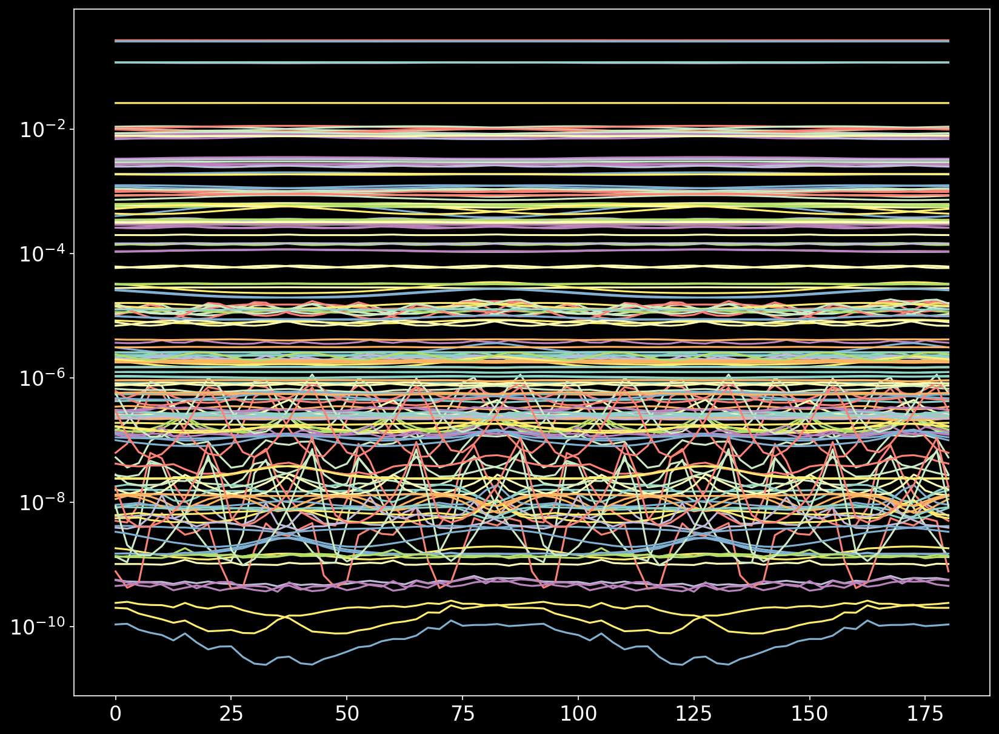

In [12]:
fig = plt.figure(figsize=(13,10), dpi=150)
plt.plot(rod_angles,rod_L8_wd2_N1)
plt.yscale('log')
plt.show()

In [11]:
pwr_std = np.std(rod_L8_wd2_N1,axis=0)
pwr_mean = np.mean(rod_L8_wd2_N1,axis=0)

In [31]:
pwr_mean.shape

(211,)

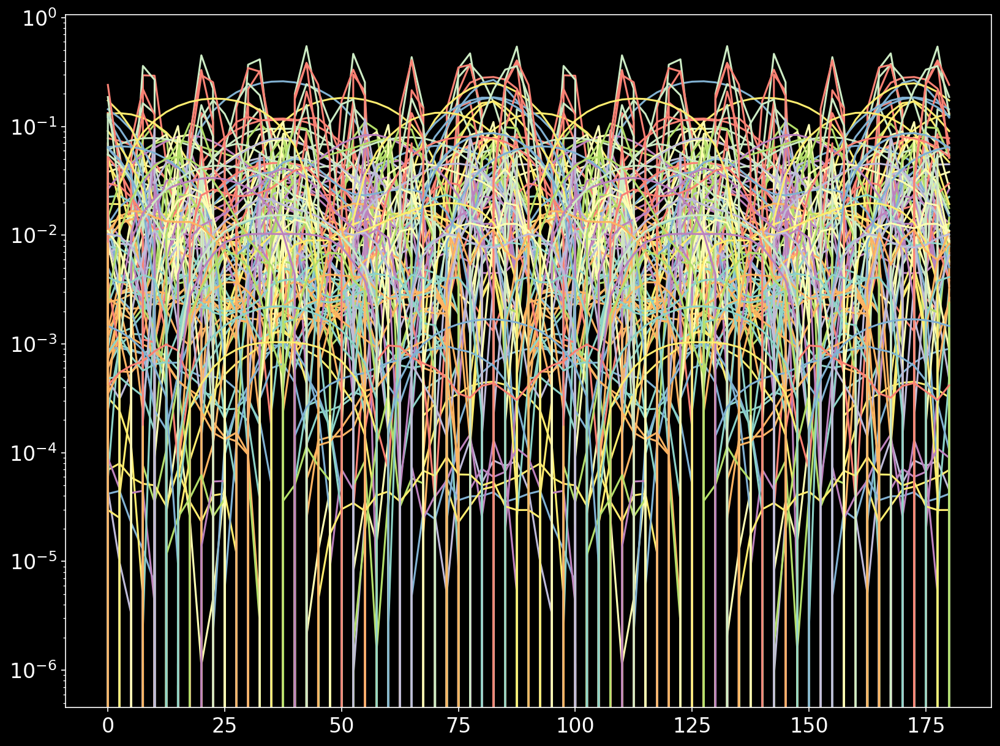

In [32]:
fig = plt.figure(figsize=(13,10), dpi=150)
plt.plot(rod_angles,(rod_L8_wd2_N1-pwr_mean)/(pwr_mean+1e-6))
plt.yscale('log')
plt.show()

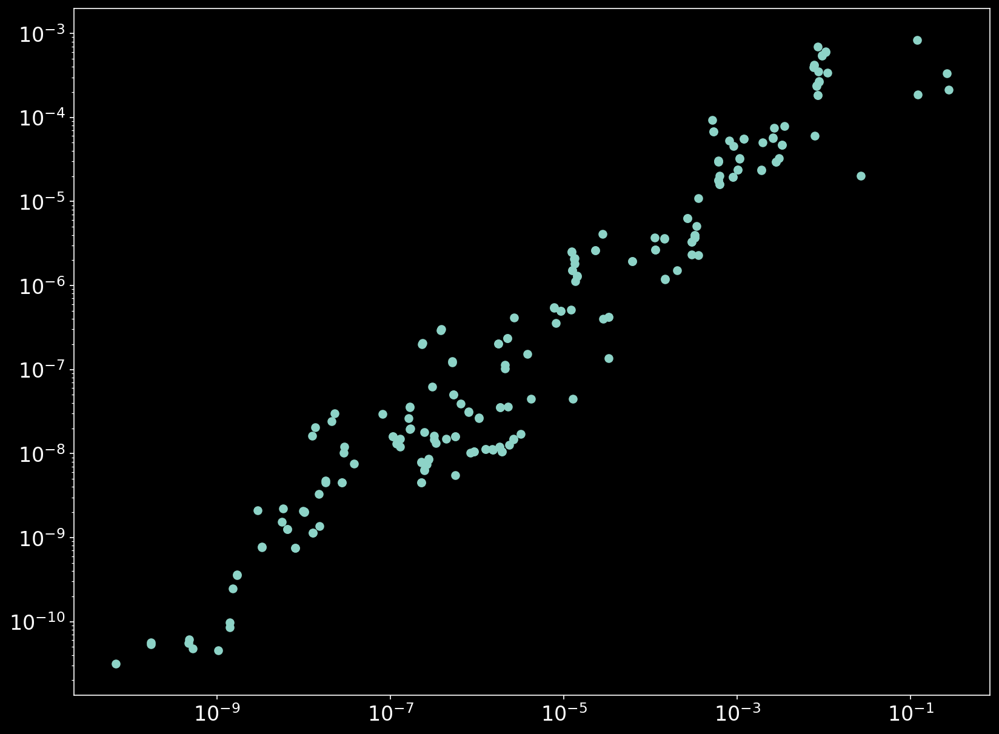

In [15]:
fig = plt.figure(figsize=(13,10), dpi=150)
plt.scatter(pwr_mean,pwr_std)
plt.yscale('log')
plt.xscale('log')
plt.show()

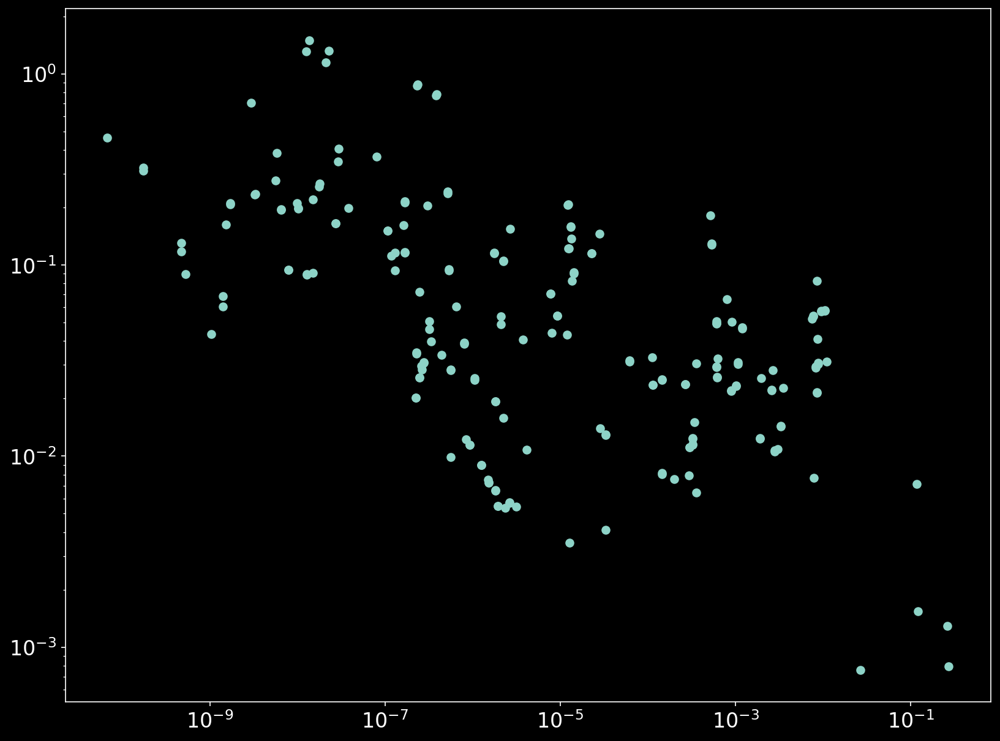

In [16]:
fig = plt.figure(figsize=(13,10), dpi=150)
plt.scatter(pwr_mean,pwr_std/pwr_mean)
plt.yscale('log')
plt.xscale('log')
plt.show()

In [18]:
rod_L16_wd2_N1 = hd5_open('../scratch_AKS/paper_data/rod_stable_L16_wd2_N1.h5','data')
pwr_std16 = np.std(rod_L16_wd2_N1,axis=0)
pwr_mean16 = np.mean(rod_L16_wd2_N1,axis=0)

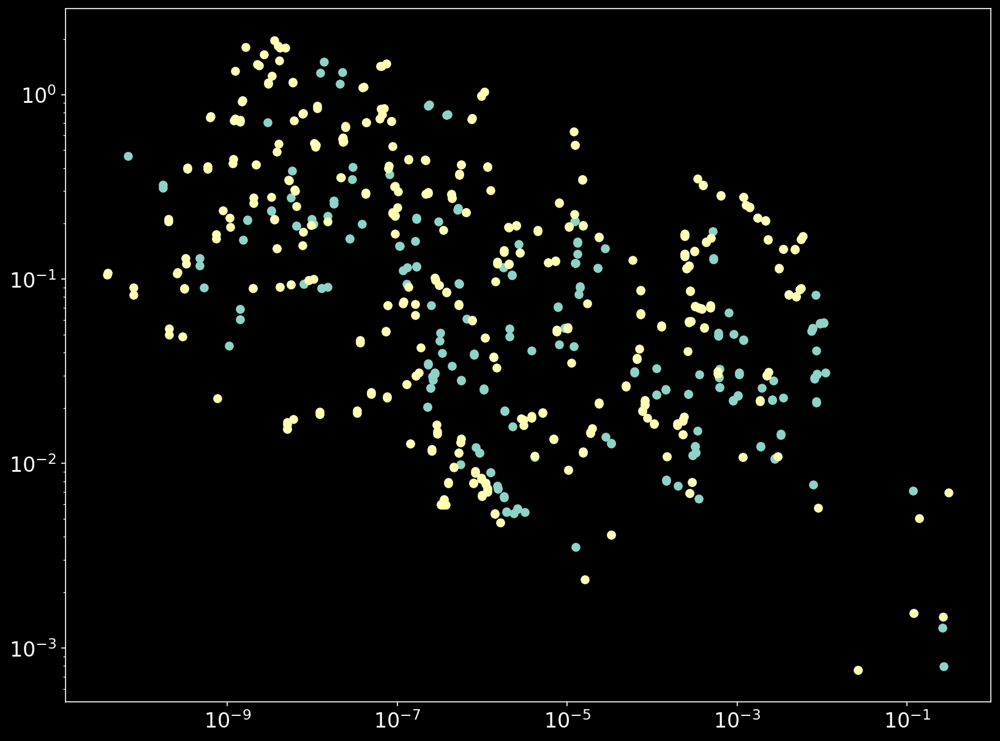

In [19]:
fig = plt.figure(figsize=(13,10), dpi=150)
plt.scatter(pwr_mean,pwr_std/pwr_mean)
plt.scatter(pwr_mean16,pwr_std16/pwr_mean16)
plt.yscale('log')
plt.xscale('log')
plt.show()

In [20]:
rod_L8_wd4_N1 = hd5_open('../scratch_AKS/paper_data/rod_stable_L8_wd4_N1.h5','data')
pwr_std4 = np.std(rod_L8_wd4_N1,axis=0)
pwr_mean4 = np.mean(rod_L8_wd4_N1,axis=0)

In [22]:
rod_L8_wd1_N1 = hd5_open('../scratch_AKS/paper_data/rod_stable_L8_wd1_N1.h5','data')
pwr_std1 = np.std(rod_L8_wd1_N1,axis=0)
pwr_mean1 = np.mean(rod_L8_wd1_N1,axis=0)

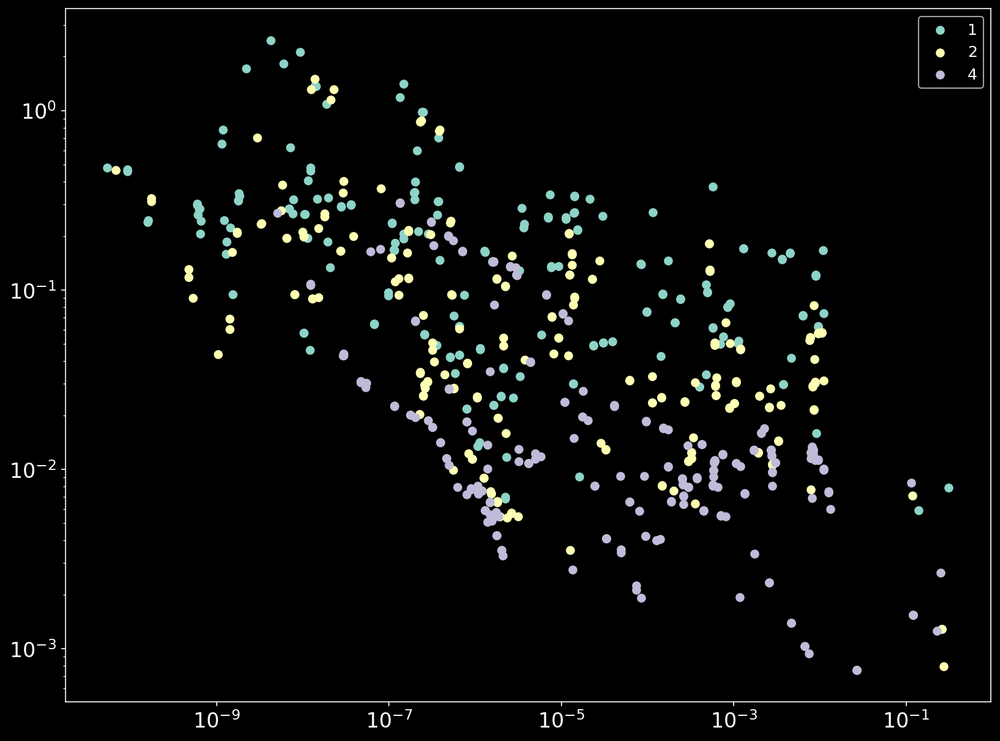

In [26]:
fig = plt.figure(figsize=(13,10), dpi=150)
plt.scatter(pwr_mean1,pwr_std1/pwr_mean1)
plt.scatter(pwr_mean,pwr_std/pwr_mean)
plt.scatter(pwr_mean4,pwr_std4/pwr_mean4)
plt.legend(["1","2","4"])
plt.yscale('log')
plt.xscale('log')
plt.show()

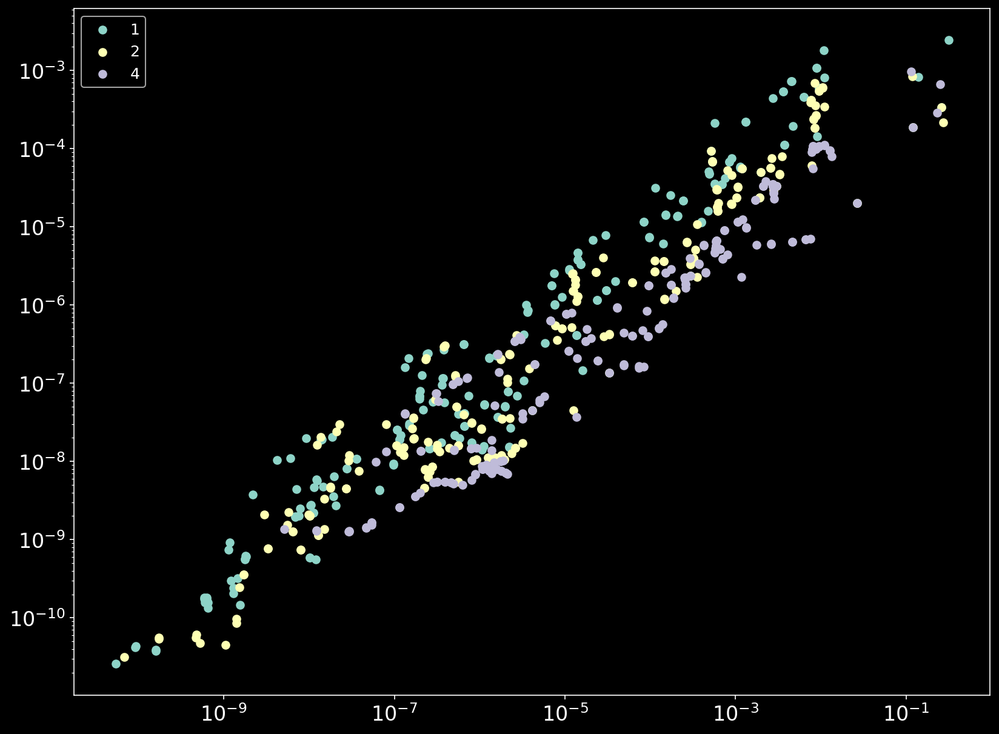

In [27]:
fig = plt.figure(figsize=(13,10), dpi=150)
plt.scatter(pwr_mean1,pwr_std1)
plt.scatter(pwr_mean,pwr_std)
plt.scatter(pwr_mean4,pwr_std4)
plt.legend(["1","2","4"])
plt.yscale('log')
plt.xscale('log')
plt.show()

In [36]:
rod_L8_wd2_N4 = hd5_open('../scratch_AKS/paper_data/rod_stable_L8_wd2_N4.h5','data')
pwr_std_N4 = np.std(rod_L8_wd2_N4,axis=0)
pwr_mean_N4 = np.mean(rod_L8_wd2_N4,axis=0)
rod_L8_wd2_N16 = hd5_open('../scratch_AKS/paper_data/rod_stable_L8_wd2_N16.h5','data')
pwr_std_N16 = np.std(rod_L8_wd2_N16,axis=0)
pwr_mean_N16 = np.mean(rod_L8_wd2_N16,axis=0)

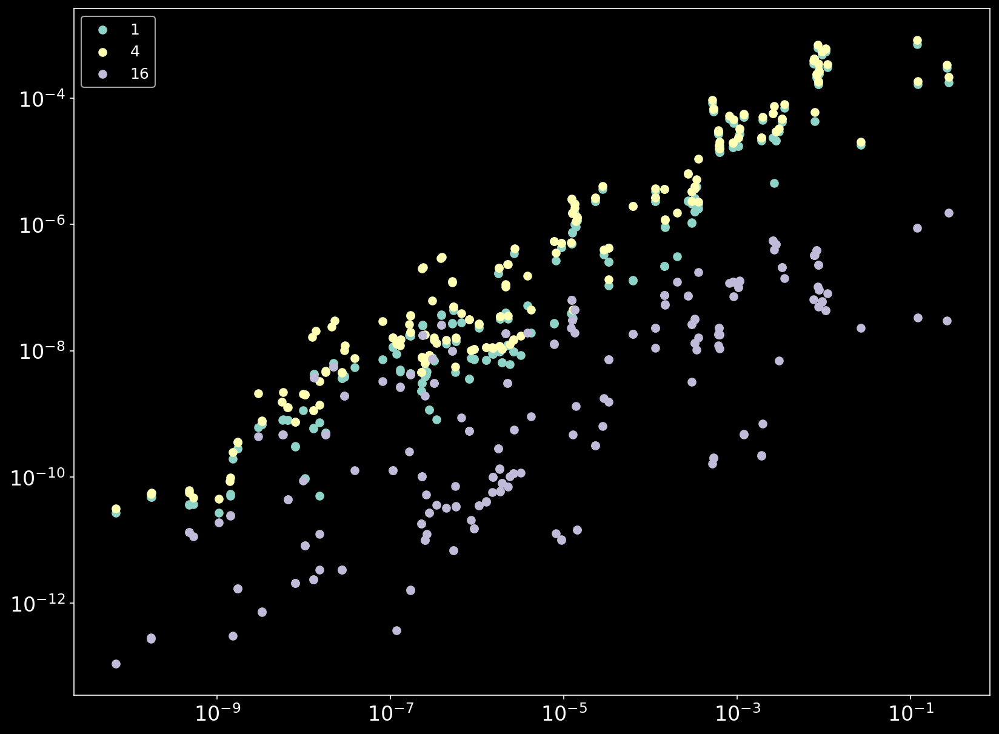

In [38]:
fig = plt.figure(figsize=(13,10), dpi=150)
plt.scatter(pwr_mean_N4,pwr_std_N4)
plt.scatter(pwr_mean,pwr_std)
plt.scatter(pwr_mean_N16,pwr_std_N16)
plt.legend(["1","4","16"])
plt.yscale('log')
plt.xscale('log')
plt.show()

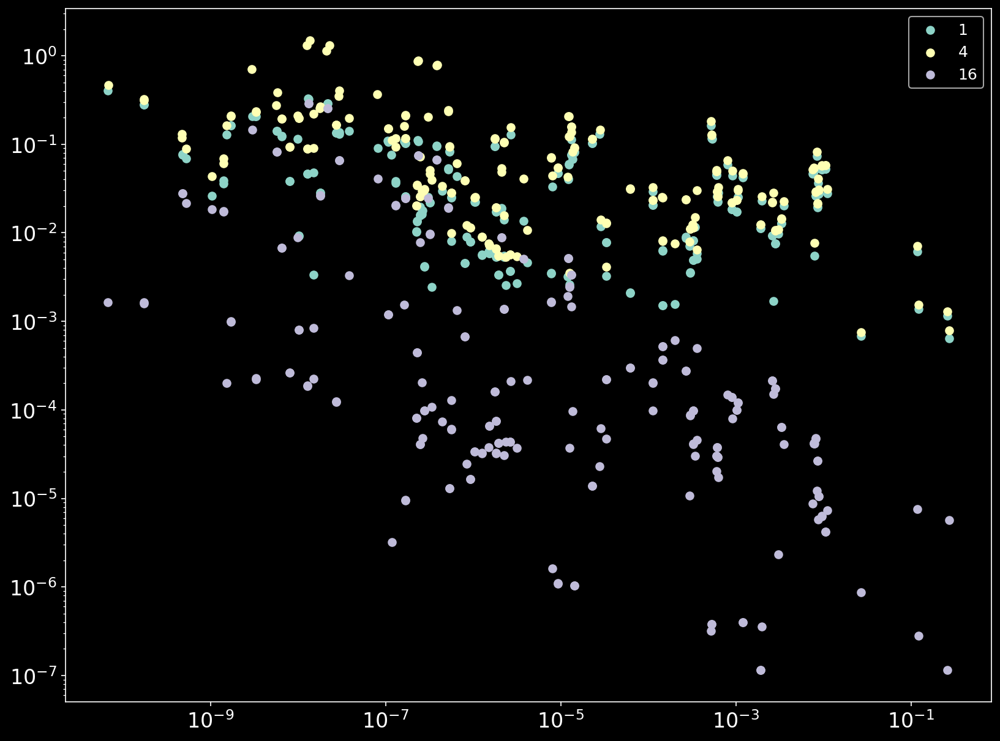

In [39]:
fig = plt.figure(figsize=(13,10), dpi=150)
plt.scatter(pwr_mean_N4,pwr_std_N4/pwr_mean_N4)
plt.scatter(pwr_mean,pwr_std/pwr_mean)
plt.scatter(pwr_mean_N16,pwr_std_N16/pwr_mean_N16)
plt.legend(["1","4","16"])
plt.yscale('log')
plt.xscale('log')
plt.show()

In [47]:
plt.style.available

['Solarize_Light2',
 '_classic_test_patch',
 'bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn',
 'seaborn-bright',
 'seaborn-colorblind',
 'seaborn-dark',
 'seaborn-dark-palette',
 'seaborn-darkgrid',
 'seaborn-deep',
 'seaborn-muted',
 'seaborn-notebook',
 'seaborn-paper',
 'seaborn-pastel',
 'seaborn-poster',
 'seaborn-talk',
 'seaborn-ticks',
 'seaborn-white',
 'seaborn-whitegrid',
 'tableau-colorblind10']

In [52]:
mpl.rcParams.update(mpl.rcParamsDefault)
rcParams['text.usetex'] = False
rcParams['axes.titlesize'] = 20
rcParams['xtick.labelsize'] = 16
rcParams['ytick.labelsize'] = 16
rcParams['legend.fontsize'] = 12
rcParams['axes.labelsize'] = 20
rcParams['font.family'] = 'sans-serif'

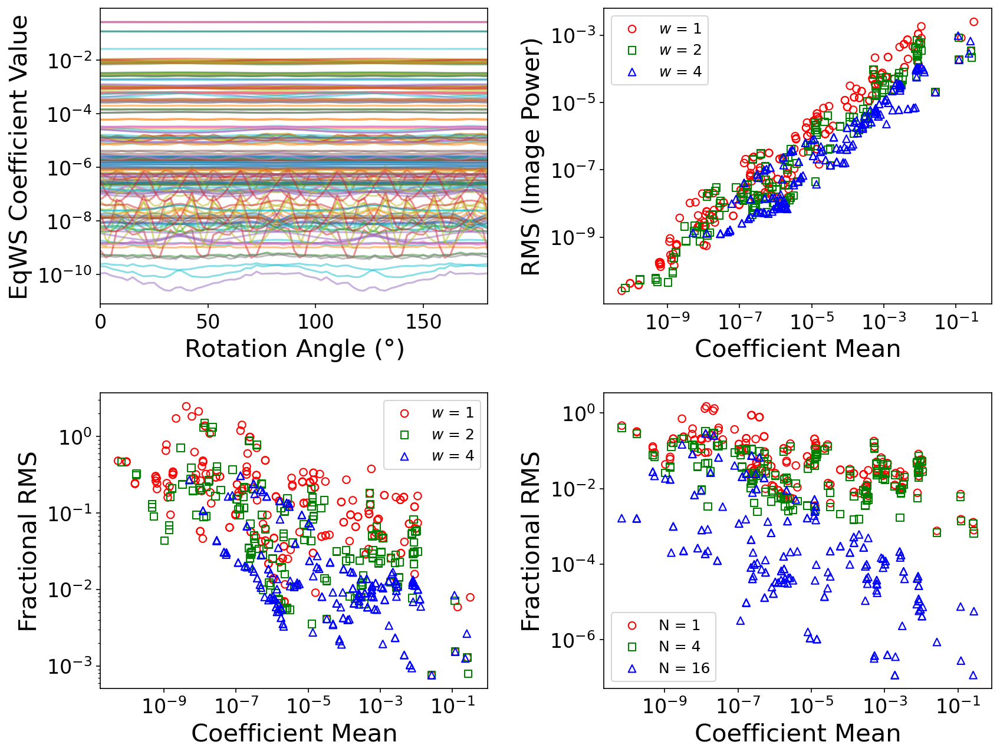

In [80]:
fig = plt.figure(figsize=(13,10), dpi=150)

ax = fig.add_subplot(2,2,1)
ax.plot(rod_angles,rod_L8_wd2_N1, alpha=0.5)
plt.xlim([0, 180])
plt.xlabel('Rotation Angle ($\degree$)')
plt.ylabel('EqWS Coefficient Value')
plt.yscale('log')

ax = fig.add_subplot(2,2,2)
ax.scatter(pwr_mean1,pwr_std1,marker='o',facecolors='none',edgecolors='r')
ax.scatter(pwr_mean,pwr_std,marker='s',facecolors='none',edgecolors='g')
ax.scatter(pwr_mean4,pwr_std4,marker='^',facecolors='none',edgecolors='b')
ax.legend(["$w$ = 1","$w$ = 2","$w$ = 4"])
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Coefficient Mean')
plt.ylabel('RMS (Image Power)')

ax = fig.add_subplot(2,2,3)
ax.scatter(pwr_mean1,pwr_std1/pwr_mean1,marker='o',facecolors='none',edgecolors='r')
ax.scatter(pwr_mean,pwr_std/pwr_mean,marker='s',facecolors='none',edgecolors='g')
ax.scatter(pwr_mean4,pwr_std4/pwr_mean4,marker='^',facecolors='none',edgecolors='b')
ax.legend(["$w$ = 1","$w$ = 2","$w$ = 4"])
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Coefficient Mean')
plt.ylabel('Fractional RMS')

ax = fig.add_subplot(2,2,4)
ax.scatter(pwr_mean,pwr_std/pwr_mean,marker='o',facecolors='none',edgecolors='r')
ax.scatter(pwr_mean_N4,pwr_std_N4/pwr_mean_N4,marker='s',facecolors='none',edgecolors='g')
ax.scatter(pwr_mean_N16,pwr_std_N16/pwr_mean_N16,marker='^',facecolors='none',edgecolors='b')
ax.legend(["N = 1","N = 4","N = 16"])
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Coefficient Mean')
plt.ylabel('Fractional RMS')

fig.subplots_adjust(wspace=0.3, hspace=0.3)
plt.savefig('../figures/CoeffStable.png', dpi=150, bbox_inches='tight', pad_inches=0.1)
plt.show()

In [2]:
mnist_train_y = hd5_open('../scratch_AKS/data/mnist_train_y.h5','main/data')
mnist_test_y = hd5_open('../scratch_AKS/data/mnist_test_y.h5','main/data')
test_angles = hd5_open('../scratch_AKS/data/angles_listjl.h5','main/test_angles')
train_angles = hd5_open('../scratch_AKS/data/angles_listjl.h5','main/train_angles')

In [3]:
mnist_DHC_train_LanRot = hd5_open('../from_cannon/2021_03_28/mnist_DHC_train_ang_LanRot.h5','data')
mnist_DHC_test_LanRot = hd5_open('../from_cannon/2021_03_28/mnist_DHC_test_ang_LanRot.h5','data')

In [4]:
def prec_LDA(lda,X_test,y_test):
    y_pred = lda.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    prec = precision_score(y_test, y_pred,average='micro')
    return prec

def DHC_iso(wst,J,L):
    (nk, Nd) = np.shape(wst)
    S0 = wst[:,0:2]
    S1 = wst[:,2:J*L+2]
    S2 = np.reshape(wst[:,J*L+3:],(nk,(J*L+1),(J*L+1)))
    
    S1iso = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            S1iso[:,j1] += S1[:,l1*J+j1]
    
    S2iso = np.zeros((nk,J,J,L))
    for j1 in range(J):
        for j2 in range(J):
            for l1 in range(L):
                for l2 in range(L):
                    deltaL = np.mod(l1-l2,L)
                    S2iso[:,j1,j2,deltaL] += S2[:,l1*J+j1,l2*J+j2]
                    
    Sphi1 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi1[:,j1] += S2[:,l1*J+j1,L*J]
            
    Sphi2 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi2[:,j1] += S2[:,L*J,l1*J+j1]
            
    return np.hstack((S0,S1iso,wst[:,J*L+2].reshape(nk,1),S2iso.reshape(nk,J*J*L),Sphi1,Sphi2,S2[:,L*J,L*J].reshape(nk,1)))

In [5]:
N = 10
lda = LDA(n_components=N-1)
lda.fit(DHC_iso(mnist_DHC_train_LanRot,6,8), np.repeat(mnist_train_y,6))

LinearDiscriminantAnalysis(n_components=9)

In [6]:
prec_mnist_angles = []
for i in range(100):
    prec_mnist_angles.append(prec_LDA(lda,DHC_iso(mnist_DHC_test_LanRot[i::100,:],6,8),mnist_test_y))

In [7]:
hf = h5py.File('../scratch_AKS/data/prec_mnist_angles_lanczos.h5', 'w')
hf.create_dataset('data', data=prec_mnist_angles)
hf.close()

In [11]:
angle_3_train = np.vstack([DHC_iso(mnist_DHC_train_LanRot[1::6,:],6,8),DHC_iso(mnist_DHC_train_LanRot[2::6,:],6,8),DHC_iso(mnist_DHC_train_LanRot[3::6,:],6,8)])

In [9]:
angle_3_test = np.hstack([mnist_train_y,mnist_train_y,mnist_train_y])

In [13]:
N = 10
lda = LDA(n_components=N-1)
lda.fit(angle_3_train, angle_3_test)

LinearDiscriminantAnalysis(n_components=9)

In [15]:
prec_mnist_angles = []
for i in range(100):
    prec_mnist_angles.append(prec_LDA(lda,DHC_iso(mnist_DHC_test_LanRot[i::100,:],6,8),mnist_test_y))

In [16]:
hf = h5py.File('../scratch_AKS/data/prec_mnist_angles_3_lanczos.h5', 'w')
hf.create_dataset('data', data=prec_mnist_angles)
hf.close()

In [17]:
mnist_DHC_train_LanRot = hd5_open('../from_cannon/2021_03_28/mnist_DHC_train_ang_LanRotResize.h5','data')
mnist_DHC_test_LanRot = hd5_open('../from_cannon/2021_03_28/mnist_DHC_test_ang_LanRotResize.h5','data')

In [9]:
N = 10
lda = LDA(n_components=N-1)
lda.fit(DHC_iso(mnist_DHC_train_LanRot,6,8), np.repeat(mnist_train_y,6))

LinearDiscriminantAnalysis(n_components=9)

In [10]:
prec_mnist_angles = []
for i in range(100):
    prec_mnist_angles.append(prec_LDA(lda,DHC_iso(mnist_DHC_test_LanRot[i::100,:],6,8),mnist_test_y))

In [11]:
hf = h5py.File('../scratch_AKS/data/prec_mnist_angles_lanczosRotResize.h5', 'w')
hf.create_dataset('data', data=prec_mnist_angles)
hf.close()

In [18]:
angle_3_train = np.vstack([DHC_iso(mnist_DHC_train_LanRot[1::6,:],6,8),DHC_iso(mnist_DHC_train_LanRot[2::6,:],6,8),DHC_iso(mnist_DHC_train_LanRot[3::6,:],6,8)])
angle_3_test = np.hstack([mnist_train_y,mnist_train_y,mnist_train_y])

In [19]:
N = 10
lda = LDA(n_components=N-1)
lda.fit(angle_3_train, angle_3_test)

LinearDiscriminantAnalysis(n_components=9)

In [20]:
prec_mnist_angles = []
for i in range(100):
    prec_mnist_angles.append(prec_LDA(lda,DHC_iso(mnist_DHC_test_LanRot[i::100,:],6,8),mnist_test_y))

In [21]:
hf = h5py.File('../scratch_AKS/data/prec_mnist_angles_3_lanczosRotResize.h5', 'w')
hf.create_dataset('data', data=prec_mnist_angles)
hf.close()

In [22]:
prec_mnist_angles = hd5_open('../scratch_AKS/data/prec_mnist_angles.h5','data')
prec_mnist_angles_noiso = hd5_open('../scratch_AKS/data/prec_mnist_angles_noiso.h5','data')
prec_mnist_angles_LanRot = hd5_open('../scratch_AKS/data/prec_mnist_angles_lanczos.h5','data')
prec_mnist_angles_LanRotResize = hd5_open('../scratch_AKS/data/prec_mnist_angles_lanczosRotResize.h5','data')

In [16]:
np.std(prec_mnist_angles),np.std(prec_mnist_angles_LanRot),np.std(prec_mnist_angles_LanRotResize)

(0.0011808200540302535, 0.0011741460726843156, 0.0010181335865199553)

In [19]:
np.mean(prec_mnist_angles),np.mean(prec_mnist_angles_LanRot),np.mean(prec_mnist_angles_LanRotResize)

(0.9205920000000001, 0.9211090000000002, 0.9222980000000001)

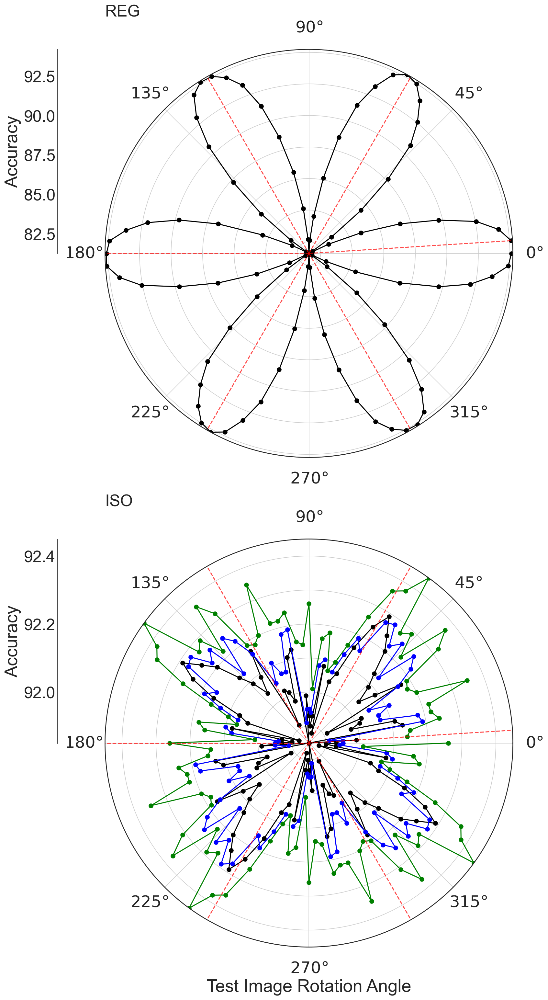

In [24]:
##
from matplotlib import transforms

mpl.rcParams.update(mpl.rcParamsDefault)
rcParams['text.usetex'] = False
rcParams['axes.titlesize'] = 24
rcParams['xtick.labelsize'] = 24
rcParams['ytick.labelsize'] = 24
rcParams['legend.fontsize'] = 12
rcParams['axes.labelsize'] = 26
rcParams['font.family'] = 'sans-serif'
plt.style.use('seaborn-white')

fig = plt.figure(figsize=(12,24),dpi=150)
ax = fig.add_subplot(211,projection='polar') 
ax.plot(test_angles,100*np.array(prec_mnist_angles_noiso), linestyle='-', marker='o',color='k')
plt.title('REG',loc='left')
ax.set_ylim(100*np.array(prec_mnist_angles_noiso).min(),100*np.array(prec_mnist_angles_noiso).max())
for x in train_angles:
    plt.axvline(x=x,linestyle='--',color='r',alpha=0.7)
    
ax.tick_params(pad=25)
xT=plt.xticks()[0]
xL=['$0 \degree$',r'$45 \degree$',r'$90 \degree$',r'$135 \degree$',r'$180 \degree$',r'$225 \degree$',r'$270 \degree$',r'$315 \degree$']
plt.xticks(xT, xL, size=24)
ax.set_yticklabels([])

box=ax.get_position()
axl=fig.add_axes([box.xmin/2, #put it half way between the edge of the 1st subplot and the left edge of the figure
                  0.5*(box.ymin+box.ymax), #put the origin at the same height of the origin of the polar plots
                  box.width/40, #Doesn't really matter, we will set everything invisible, except the y axis
                  box.height*0.5])
axl.spines['top'].set_visible(False)
axl.spines['right'].set_visible(False)
axl.spines['bottom'].set_visible(False)
axl.yaxis.set_ticks_position('both')
axl.xaxis.set_ticks_position('none')
axl.set_xticklabels([])
axl.set_ylim(100*np.array(prec_mnist_angles_noiso).min(),100*np.array(prec_mnist_angles_noiso).max())
axl.set_ylabel('Accuracy', rotation=90)

ax = fig.add_subplot(212,projection='polar') 
ax.plot(test_angles,100*np.array(prec_mnist_angles), linestyle='-', marker='o',color='k')
ax.plot(test_angles,100*np.array(prec_mnist_angles_LanRot), linestyle='-', marker='o',color='b')
ax.plot(test_angles,100*np.array(prec_mnist_angles_LanRotResize), linestyle='-', marker='o',color='g')
plt.xlabel('Test Image Rotation Angle')
plt.title('ISO',loc='left')
ax.set_ylim(100*np.array(prec_mnist_angles).min(),100*np.array(prec_mnist_angles_LanRotResize).max())
for x in train_angles:
    plt.axvline(x=x,linestyle='--',color='r',alpha=0.7)
    
ax.tick_params(pad=25)
xT=plt.xticks()[0]
xL=['$0 \degree$',r'$45 \degree$',r'$90 \degree$',r'$135 \degree$',r'$180 \degree$',r'$225 \degree$',r'$270 \degree$',r'$315 \degree$']
plt.xticks(xT, xL, size=24)
ax.set_yticklabels([])

box=ax.get_position()
axl=fig.add_axes([box.xmin/2, #put it half way between the edge of the 1st subplot and the left edge of the figure
                  0.5*(box.ymin+box.ymax), #put the origin at the same height of the origin of the polar plots
                  box.width/40, #Doesn't really matter, we will set everything invisible, except the y axis
                  box.height*0.5])
axl.spines['top'].set_visible(False)
axl.spines['right'].set_visible(False)
axl.spines['bottom'].set_visible(False)
axl.yaxis.set_ticks_position('both')
axl.xaxis.set_ticks_position('none')
axl.set_xticklabels([])
axl.set_ylim(100*np.array(prec_mnist_angles).min(),100*np.array(prec_mnist_angles_LanRotResize).max())
axl.set_ylabel('Accuracy', rotation=90)

fig.subplots_adjust(hspace=0.2,wspace=0)
plt.show()

In [47]:
prec_mnist_angles = hd5_open('../scratch_AKS/data/prec_mnist_angles_3.h5','data')
prec_mnist_angles_noiso = hd5_open('../scratch_AKS/data/prec_mnist_angles_noiso_3.h5','data')
prec_mnist_angles_LanRot = hd5_open('../scratch_AKS/data/prec_mnist_angles_3_lanczos.h5','data')
prec_mnist_angles_LanRotResize = hd5_open('../scratch_AKS/data/prec_mnist_angles_3_lanczosRotResize.h5','data')

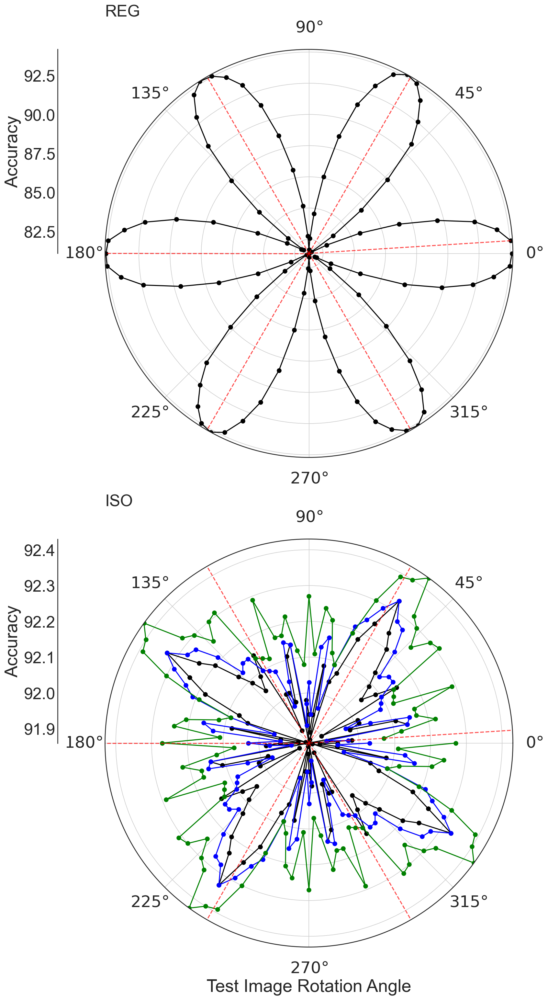

In [27]:
##
from matplotlib import transforms

mpl.rcParams.update(mpl.rcParamsDefault)
rcParams['text.usetex'] = False
rcParams['axes.titlesize'] = 24
rcParams['xtick.labelsize'] = 24
rcParams['ytick.labelsize'] = 24
rcParams['legend.fontsize'] = 12
rcParams['axes.labelsize'] = 26
rcParams['font.family'] = 'sans-serif'
plt.style.use('seaborn-white')

fig = plt.figure(figsize=(12,24),dpi=150)
ax = fig.add_subplot(211,projection='polar') 
ax.plot(test_angles,100*np.array(prec_mnist_angles_noiso), linestyle='-', marker='o',color='k')
plt.title('REG',loc='left')
ax.set_ylim(100*np.array(prec_mnist_angles_noiso).min(),100*np.array(prec_mnist_angles_noiso).max())
for x in train_angles:
    plt.axvline(x=x,linestyle='--',color='r',alpha=0.7)
    
ax.tick_params(pad=25)
xT=plt.xticks()[0]
xL=['$0 \degree$',r'$45 \degree$',r'$90 \degree$',r'$135 \degree$',r'$180 \degree$',r'$225 \degree$',r'$270 \degree$',r'$315 \degree$']
plt.xticks(xT, xL, size=24)
ax.set_yticklabels([])

box=ax.get_position()
axl=fig.add_axes([box.xmin/2, #put it half way between the edge of the 1st subplot and the left edge of the figure
                  0.5*(box.ymin+box.ymax), #put the origin at the same height of the origin of the polar plots
                  box.width/40, #Doesn't really matter, we will set everything invisible, except the y axis
                  box.height*0.5])
axl.spines['top'].set_visible(False)
axl.spines['right'].set_visible(False)
axl.spines['bottom'].set_visible(False)
axl.yaxis.set_ticks_position('both')
axl.xaxis.set_ticks_position('none')
axl.set_xticklabels([])
axl.set_ylim(100*np.array(prec_mnist_angles_noiso).min(),100*np.array(prec_mnist_angles_noiso).max())
axl.set_ylabel('Accuracy', rotation=90)

ax = fig.add_subplot(212,projection='polar') 
ax.plot(test_angles,100*np.array(prec_mnist_angles), linestyle='-', marker='o',color='k')
ax.plot(test_angles,100*np.array(prec_mnist_angles_LanRot), linestyle='-', marker='o',color='b')
ax.plot(test_angles,100*np.array(prec_mnist_angles_LanRotResize), linestyle='-', marker='o',color='g')
plt.xlabel('Test Image Rotation Angle')
plt.title('ISO',loc='left')
ax.set_ylim(100*np.array(prec_mnist_angles).min(),100*np.array(prec_mnist_angles_LanRotResize).max())
for x in train_angles:
    plt.axvline(x=x,linestyle='--',color='r',alpha=0.7)
    
ax.tick_params(pad=25)
xT=plt.xticks()[0]
xL=['$0 \degree$',r'$45 \degree$',r'$90 \degree$',r'$135 \degree$',r'$180 \degree$',r'$225 \degree$',r'$270 \degree$',r'$315 \degree$']
plt.xticks(xT, xL, size=24)
ax.set_yticklabels([])

box=ax.get_position()
axl=fig.add_axes([box.xmin/2, #put it half way between the edge of the 1st subplot and the left edge of the figure
                  0.5*(box.ymin+box.ymax), #put the origin at the same height of the origin of the polar plots
                  box.width/40, #Doesn't really matter, we will set everything invisible, except the y axis
                  box.height*0.5])
axl.spines['top'].set_visible(False)
axl.spines['right'].set_visible(False)
axl.spines['bottom'].set_visible(False)
axl.yaxis.set_ticks_position('both')
axl.xaxis.set_ticks_position('none')
axl.set_xticklabels([])
axl.set_ylim(100*np.array(prec_mnist_angles).min(),100*np.array(prec_mnist_angles_LanRotResize).max())
axl.set_ylabel('Accuracy', rotation=90)

fig.subplots_adjust(hspace=0.2,wspace=0)
plt.show()

In [48]:
prec_mnist_angles.shape,prec_mnist_angles_noiso.shape,prec_mnist_angles_LanRot.shape,prec_mnist_angles_LanRotResize.shape

((100,), (100,), (100,), (100,))

In [49]:
prec_mnist_angles = np.hstack([prec_mnist_angles,prec_mnist_angles[0]])
prec_mnist_angles_noiso = np.hstack([prec_mnist_angles_noiso,prec_mnist_angles_noiso[0]])
prec_mnist_angles_LanRot = np.hstack([prec_mnist_angles_LanRot,prec_mnist_angles_LanRot[0]])
prec_mnist_angles_LanRotResize = np.hstack([prec_mnist_angles_LanRotResize,prec_mnist_angles_LanRotResize[0]])

In [50]:
prec_mnist_angles.shape,prec_mnist_angles_noiso.shape,prec_mnist_angles_LanRot.shape,prec_mnist_angles_LanRotResize.shape

((101,), (101,), (101,), (101,))

In [52]:
test_angles = np.hstack([test_angles,test_angles[0]])

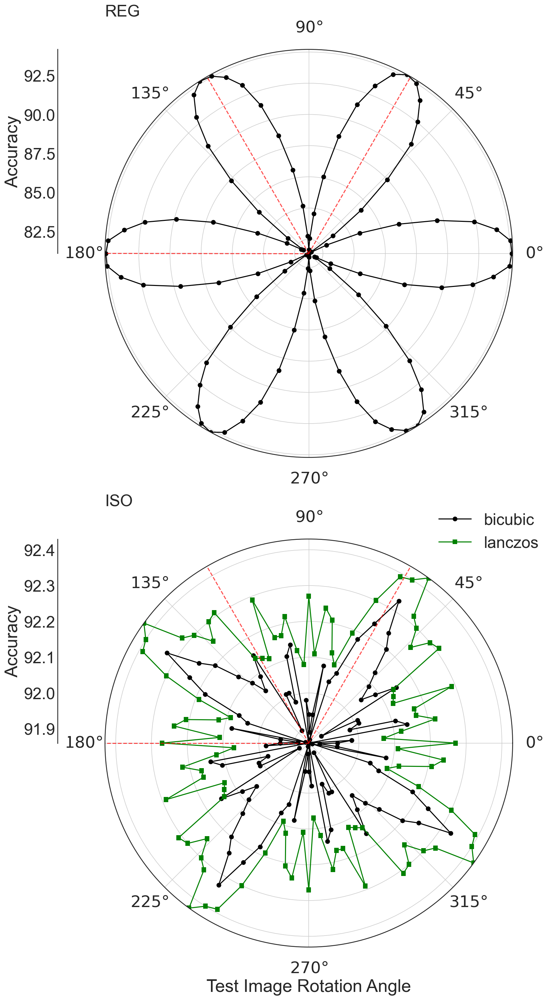

In [65]:
##
from matplotlib import transforms

mpl.rcParams.update(mpl.rcParamsDefault)
rcParams['text.usetex'] = False
rcParams['axes.titlesize'] = 24
rcParams['xtick.labelsize'] = 24
rcParams['ytick.labelsize'] = 24
rcParams['legend.fontsize'] = 12
rcParams['axes.labelsize'] = 26
rcParams['font.family'] = 'sans-serif'
plt.style.use('seaborn-white')

fig = plt.figure(figsize=(12,24),dpi=150)
ax = fig.add_subplot(211,projection='polar') 
ax.plot(test_angles,100*np.array(prec_mnist_angles_noiso), linestyle='-', marker='o',color='k')
plt.title('REG',loc='left')
ax.set_ylim(100*np.array(prec_mnist_angles_noiso).min(),100*np.array(prec_mnist_angles_noiso).max())
for x in train_angles[1:4]:
    plt.axvline(x=x,linestyle='--',color='r',alpha=0.7)
    
ax.tick_params(pad=25)
xT=plt.xticks()[0]
xL=['$0 \degree$',r'$45 \degree$',r'$90 \degree$',r'$135 \degree$',r'$180 \degree$',r'$225 \degree$',r'$270 \degree$',r'$315 \degree$']
plt.xticks(xT, xL, size=24)
ax.set_yticklabels([])

box=ax.get_position()
axl=fig.add_axes([box.xmin/2, #put it half way between the edge of the 1st subplot and the left edge of the figure
                  0.5*(box.ymin+box.ymax), #put the origin at the same height of the origin of the polar plots
                  box.width/40, #Doesn't really matter, we will set everything invisible, except the y axis
                  box.height*0.5])
axl.spines['top'].set_visible(False)
axl.spines['right'].set_visible(False)
axl.spines['bottom'].set_visible(False)
axl.yaxis.set_ticks_position('both')
axl.xaxis.set_ticks_position('none')
axl.set_xticklabels([])
axl.set_ylim(100*np.array(prec_mnist_angles_noiso).min(),100*np.array(prec_mnist_angles_noiso).max())
axl.set_ylabel('Accuracy', rotation=90)

ax = fig.add_subplot(212,projection='polar') 
ax.plot(test_angles,100*np.array(prec_mnist_angles), linestyle='-', marker='o',color='k',label='bicubic')
ax.plot(test_angles,100*np.array(prec_mnist_angles_LanRotResize), linestyle='-', marker='s',color='g',label='lanczos')
plt.xlabel('Test Image Rotation Angle')
plt.title('ISO',loc='left')
ax.set_ylim(100*np.array(prec_mnist_angles).min(),100*np.array(prec_mnist_angles_LanRotResize).max())
for x in train_angles[1:4]:
    plt.axvline(x=x,linestyle='--',color='r',alpha=0.7)
    
ax.tick_params(pad=25)
xT=plt.xticks()[0]
xL=['$0 \degree$',r'$45 \degree$',r'$90 \degree$',r'$135 \degree$',r'$180 \degree$',r'$225 \degree$',r'$270 \degree$',r'$315 \degree$']
plt.xticks(xT, xL, size=24)
ax.set_yticklabels([])
plt.legend(fontsize=24,bbox_to_anchor=(1.1, 1.1))

box=ax.get_position()
axl=fig.add_axes([box.xmin/2, #put it half way between the edge of the 1st subplot and the left edge of the figure
                  0.5*(box.ymin+box.ymax), #put the origin at the same height of the origin of the polar plots
                  box.width/40, #Doesn't really matter, we will set everything invisible, except the y axis
                  box.height*0.5])
axl.spines['top'].set_visible(False)
axl.spines['right'].set_visible(False)
axl.spines['bottom'].set_visible(False)
axl.yaxis.set_ticks_position('both')
axl.xaxis.set_ticks_position('none')
axl.set_xticklabels([])
axl.set_ylim(100*np.array(prec_mnist_angles).min(),100*np.array(prec_mnist_angles_LanRotResize).max())
axl.set_ylabel('Accuracy', rotation=90)

fig.subplots_adjust(hspace=0.2,wspace=0)
plt.show()

3 angle equivariance average

In [65]:
mnist_DHC_out_angles = hd5_open('../from_cannon/2021_01_20/mnist_DHC_test_angles.h5','main/data')

In [66]:
mnist_DHC_out_rotpi_3 = hd5_open('../scratch_AKS/data/mnist_DHC_out_rotpi_3.h5','main/data')
mnist_DHC_out_rotpi_3_test = hd5_open('../scratch_AKS/data/mnist_DHC_out_rotpi_3_test.h5','main/data')

mnist_DHC_out_rot2pi_3 = hd5_open('../scratch_AKS/data/mnist_DHC_out_rot2pi_3.h5','main/data')
mnist_DHC_out_rot2pi_3_test = hd5_open('../scratch_AKS/data/mnist_DHC_out_rot2pi_3_test.h5','main/data')

mnist_DHC_out_rot3pi_3 = hd5_open('../scratch_AKS/data/mnist_DHC_out_rot3pi_3.h5','main/data')
mnist_DHC_out_rot3pi_3_test = hd5_open('../scratch_AKS/data/mnist_DHC_out_rot3pi_3_test.h5','main/data')

In [67]:
mnist_DHC_out_stack_train_y = mnist_train_y
mnist_DHC_out_stack_test_y = mnist_test_y

In [68]:
def prec_LDA(lda,X_test,y_test):
    y_pred = lda.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    prec = precision_score(y_test, y_pred,average='micro')
    return prec

def DHC_iso(wst,J,L):
    (nk, Nd) = np.shape(wst)
    S0 = wst[:,0:2]
    S1 = wst[:,2:J*L+2]
    S2 = np.reshape(wst[:,J*L+3:],(nk,(J*L+1),(J*L+1)))
    
    S1iso = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            S1iso[:,j1] += S1[:,l1*J+j1]
    
    S2iso = np.zeros((nk,J,J,L))
    for j1 in range(J):
        for j2 in range(J):
            for l1 in range(L):
                for l2 in range(L):
                    deltaL = np.mod(l1-l2,L)
                    S2iso[:,j1,j2,deltaL] += S2[:,l1*J+j1,l2*J+j2]
                    
    Sphi1 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi1[:,j1] += S2[:,l1*J+j1,L*J]
            
    Sphi2 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi2[:,j1] += S2[:,L*J,l1*J+j1]
            
    return np.hstack((S0,S1iso,wst[:,J*L+2].reshape(nk,1),S2iso.reshape(nk,J*J*L),Sphi1,Sphi2,S2[:,L*J,L*J].reshape(nk,1)))

In [69]:
mnist_DHC_out_rotpi_3.shape

(60000, 2452)

In [70]:
np.mean([mnist_DHC_out_rotpi_3,mnist_DHC_out_rot2pi_3,mnist_DHC_out_rot3pi_3], axis=0).shape

(60000, 2452)

In [71]:
mnist_DHC_out_stack = np.mean([DHC_iso(mnist_DHC_out_rotpi_3,6,8),DHC_iso(mnist_DHC_out_rot2pi_3,6,8),DHC_iso(mnist_DHC_out_rot3pi_3,6,8)], axis=0)
mnist_DHC_out_stack_test = np.mean([DHC_iso(mnist_DHC_out_rotpi_3_test,6,8),DHC_iso(mnist_DHC_out_rot2pi_3_test,6,8),DHC_iso(mnist_DHC_out_rot3pi_3_test,6,8)], axis=0)

In [72]:
temp = [DHC_iso(mnist_DHC_out_rotpi_3_test,6,8),DHC_iso(mnist_DHC_out_rot2pi_3_test,6,8),DHC_iso(mnist_DHC_out_rot3pi_3_test,6,8)]

In [73]:
temp_test = np.mean(np.array(temp),axis=0)
temp_test.shape

(10000, 310)

In [74]:
temp_test[:,1]

array([0.00290448, 0.00496716, 0.00145081, ..., 0.00543866, 0.00466552,
       0.00777426])

In [75]:
mnist_DHC_out_rot2pi_3_test[:,1]

array([0.00290427, 0.00496688, 0.00145066, ..., 0.00543845, 0.00466527,
       0.00777395])

In [76]:
mnist_DHC_out_stack.shape, mnist_DHC_out_stack_test.shape

((60000, 310), (10000, 310))

In [77]:
N = 10
lda = LDA(n_components=N-1)
lda.fit(mnist_DHC_out_stack, mnist_DHC_out_stack_train_y)

LinearDiscriminantAnalysis(n_components=9)

In [78]:
y_pred = lda.predict(mnist_DHC_out_stack_test)
cm = confusion_matrix(mnist_DHC_out_stack_test_y, y_pred)
prec = precision_score(mnist_DHC_out_stack_test_y, y_pred,average='micro')

In [79]:
prec

0.9272

In [80]:
i =1
prec_LDA(lda,DHC_iso(mnist_DHC_out_angles[i::100,:],6,8),mnist_test_y)

0.2037

Seems we need to be very careful about the standard scaling?

In [81]:
mnist_DHC_out_stackv = np.vstack((DHC_iso(mnist_DHC_out_rotpi_3,6,8),DHC_iso(mnist_DHC_out_rot2pi_3,6,8),DHC_iso(mnist_DHC_out_rot3pi_3,6,8)))
mnist_DHC_out_stack_tesvv = np.vstack((DHC_iso(mnist_DHC_out_rotpi_3_test,6,8),DHC_iso(mnist_DHC_out_rot2pi_3_test,6,8),DHC_iso(mnist_DHC_out_rot3pi_3_test,6,8)))

mnist_DHC_out_stack_train_yv = np.hstack((mnist_train_y,mnist_train_y,mnist_train_y))
mnist_DHC_out_stack_test_yv = np.hstack((mnist_test_y,mnist_test_y,mnist_test_y))

In [82]:
sc = StandardScaler()
X_train = sc.fit(mnist_DHC_out_stackv)

In [83]:
N = 10
lda = LDA(n_components=N-1)
lda.fit(sc.transform(mnist_DHC_out_stack), mnist_DHC_out_stack_train_y)

LinearDiscriminantAnalysis(n_components=9)

In [84]:
y_pred = lda.predict(sc.transform(mnist_DHC_out_stack_tesvv))
cm = confusion_matrix(mnist_DHC_out_stack_test_yv, y_pred)
prec = precision_score(mnist_DHC_out_stack_test_yv, y_pred,average='micro')
prec

0.16346666666666668

In [85]:
y_pred = lda.predict(sc.transform(mnist_DHC_out_stack_test))
cm = confusion_matrix(mnist_DHC_out_stack_test_y, y_pred)
prec = precision_score(mnist_DHC_out_stack_test_y, y_pred,average='micro')
prec

0.9272

In [86]:
prec_LDA(lda,sc.transform(DHC_iso(mnist_DHC_out_angles[i::100,:],6,8)),mnist_test_y)

0.2037

In [43]:
prec_mnist_angles = []
for i in range(100):
    prec_mnist_angles.append(prec_LDA(lda,DHC_iso(mnist_DHC_out_angles[i::100,:],6,8),mnist_test_y))

In [44]:
prec_mnist_angles

[0.2064,
 0.2037,
 0.2055,
 0.2048,
 0.2002,
 0.1836,
 0.1648,
 0.1467,
 0.1326,
 0.123,
 0.1118,
 0.1057,
 0.1054,
 0.1083,
 0.1185,
 0.1335,
 0.1527,
 0.1674,
 0.1831,
 0.1926,
 0.2024,
 0.2062,
 0.2065,
 0.2052,
 0.2043,
 0.2065,
 0.2037,
 0.2055,
 0.2048,
 0.2002,
 0.1836,
 0.1648,
 0.1467,
 0.1326,
 0.123,
 0.1118,
 0.1057,
 0.1054,
 0.1083,
 0.1185,
 0.1335,
 0.1527,
 0.1674,
 0.1831,
 0.1926,
 0.2024,
 0.2062,
 0.2066,
 0.2052,
 0.2043,
 0.2064,
 0.2037,
 0.2055,
 0.2048,
 0.2001,
 0.1836,
 0.1648,
 0.1467,
 0.1326,
 0.123,
 0.1118,
 0.1057,
 0.1054,
 0.1083,
 0.1184,
 0.1335,
 0.1527,
 0.1674,
 0.1831,
 0.1926,
 0.2024,
 0.2062,
 0.2065,
 0.2052,
 0.2043,
 0.2064,
 0.2037,
 0.2055,
 0.2048,
 0.2001,
 0.1836,
 0.1648,
 0.1467,
 0.1326,
 0.123,
 0.1118,
 0.1057,
 0.1054,
 0.1083,
 0.1185,
 0.1335,
 0.1527,
 0.1674,
 0.1831,
 0.1926,
 0.2024,
 0.2062,
 0.2065,
 0.2052,
 0.2043]

In [33]:
hf = h5py.File('../scratch_AKS/data/prec_mnist_angles_3avg.h5', 'w')
hf.create_dataset('data', data=prec_mnist_angles)
hf.close()

In [36]:
prec_mnist_angles3 = hd5_open('../scratch_AKS/data/prec_mnist_angles_3.h5','data')
prec_mnist_angles_noiso3 = hd5_open('../scratch_AKS/data/prec_mnist_angles_noiso_3.h5','data')
prec_mnist_angles3avg = hd5_open('../scratch_AKS/data/prec_mnist_angles_3avg.h5','data')

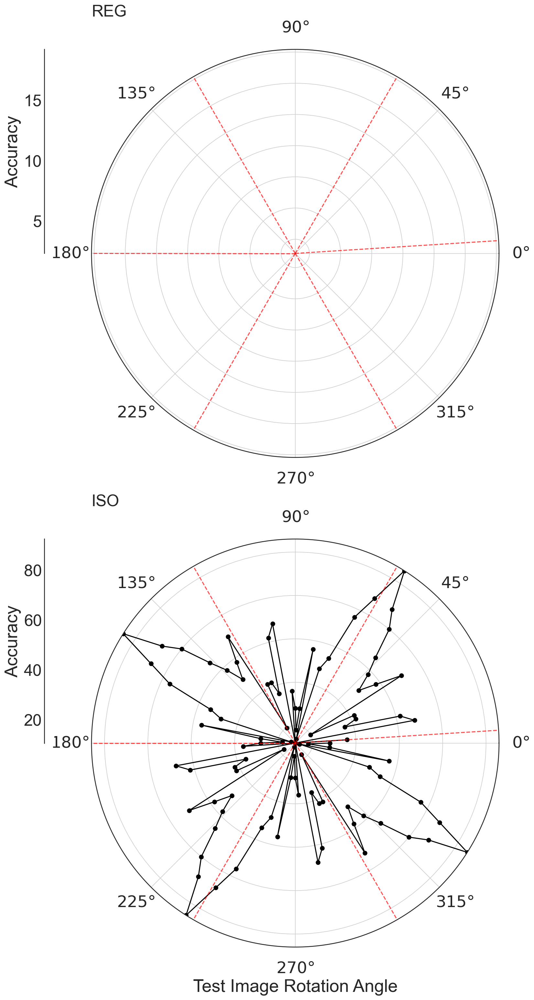

In [38]:
##
from matplotlib import transforms

mpl.rcParams.update(mpl.rcParamsDefault)
rcParams['text.usetex'] = False
rcParams['axes.titlesize'] = 24
rcParams['xtick.labelsize'] = 24
rcParams['ytick.labelsize'] = 24
rcParams['legend.fontsize'] = 12
rcParams['axes.labelsize'] = 26
rcParams['font.family'] = 'sans-serif'
plt.style.use('seaborn-white')

fig = plt.figure(figsize=(12,24),dpi=150)
ax = fig.add_subplot(211,projection='polar') 
ax.plot(test_angles,100*np.array(prec_mnist_angles_noiso3), linestyle='-', marker='o',color='k')
plt.title('REG',loc='left')
ax.set_ylim(100*np.array(prec_mnist_angles_noiso3).min(),100*np.array(prec_mnist_angles_noiso3).max())
for x in train_angles:
    plt.axvline(x=x,linestyle='--',color='r',alpha=0.7)
    
ax.tick_params(pad=25)
xT=plt.xticks()[0]
xL=['$0 \degree$',r'$45 \degree$',r'$90 \degree$',r'$135 \degree$',r'$180 \degree$',r'$225 \degree$',r'$270 \degree$',r'$315 \degree$']
plt.xticks(xT, xL, size=24)
ax.set_yticklabels([])

box=ax.get_position()
axl=fig.add_axes([box.xmin/2, #put it half way between the edge of the 1st subplot and the left edge of the figure
                  0.5*(box.ymin+box.ymax), #put the origin at the same height of the origin of the polar plots
                  box.width/40, #Doesn't really matter, we will set everything invisible, except the y axis
                  box.height*0.5])
axl.spines['top'].set_visible(False)
axl.spines['right'].set_visible(False)
axl.spines['bottom'].set_visible(False)
axl.yaxis.set_ticks_position('both')
axl.xaxis.set_ticks_position('none')
axl.set_xticklabels([])
axl.set_ylim(100*np.array(prec_mnist_angles_noiso).min(),100*np.array(prec_mnist_angles_noiso).max())
axl.set_ylabel('Accuracy', rotation=90)

ax = fig.add_subplot(212,projection='polar') 
ax.plot(test_angles,100*np.array(prec_mnist_angles3), linestyle='-', marker='o',color='k')
ax.plot(test_angles,100*np.array(prec_mnist_angles3avg), linestyle='-', marker='s',color='g')
plt.xlabel('Test Image Rotation Angle')
plt.title('ISO',loc='left')
ax.set_ylim(100*np.array(prec_mnist_angles3).min(),100*np.array(prec_mnist_angles3).max())
for x in train_angles:
    plt.axvline(x=x,linestyle='--',color='r',alpha=0.7)
    
ax.tick_params(pad=25)
xT=plt.xticks()[0]
xL=['$0 \degree$',r'$45 \degree$',r'$90 \degree$',r'$135 \degree$',r'$180 \degree$',r'$225 \degree$',r'$270 \degree$',r'$315 \degree$']
plt.xticks(xT, xL, size=24)
ax.set_yticklabels([])

box=ax.get_position()
axl=fig.add_axes([box.xmin/2, #put it half way between the edge of the 1st subplot and the left edge of the figure
                  0.5*(box.ymin+box.ymax), #put the origin at the same height of the origin of the polar plots
                  box.width/40, #Doesn't really matter, we will set everything invisible, except the y axis
                  box.height*0.5])
axl.spines['top'].set_visible(False)
axl.spines['right'].set_visible(False)
axl.spines['bottom'].set_visible(False)
axl.yaxis.set_ticks_position('both')
axl.xaxis.set_ticks_position('none')
axl.set_xticklabels([])
axl.set_ylim(100*np.array(prec_mnist_angles).min(),100*np.array(prec_mnist_angles_LanRotResize).max())
axl.set_ylabel('Accuracy', rotation=90)

fig.subplots_adjust(hspace=0.2,wspace=0)
plt.show()

Equivariant Angle Augmentation for the Angle Problem

In [5]:
from julia.api import Julia
jl = Julia(compiled_modules=False)
import julia
from julia import Main
import julia.Base
%load_ext julia.magic

The julia.magic extension is already loaded. To reload it, use:
  %reload_ext julia.magic


In [19]:
%%julia
push!(LOAD_PATH, "/Users/saydjari/Dropbox/GradSchool_AKS/Doug/Projects/DHC/from_cannon/2021_03_09/")
import DHC_2DUtils
using SparseArrays
using HDF5

UsageError: Cell magic `%%julia` not found.


In [20]:
filename = 'equiv_workup_L3.h5'
mnist_DHC_out_train = hd5_open('../from_cannon/2021_03_09/mnist_DHC_train_eq_L3_s.h5','main/data')
mnist_DHC_out_test = hd5_open('../from_cannon/2021_03_09/mnist_DHC_test_eq_L3_s.h5','main/data')
mnist_DHC_out_train_angles = hd5_open('../from_cannon/2021_03_09/mnist_DHC_train_eq_L3_s.h5','main/angles')
mnist_DHC_out_test_angles = hd5_open('../from_cannon/2021_03_09/mnist_DHC_test_eq_L3_s.h5','main/angles')

In [3]:
mnist_DHC_out_test.shape, mnist_DHC_out_train.shape, mnist_DHC_out_test_angles.shape, mnist_DHC_out_train_angles.shape

((480000, 274), (1440000, 274), (48,), (24,))

In [7]:
%%julia
L=3
mnist_DHC_out_test = h5read("../from_cannon/2021_03_09/mnist_DHC_train_eq_L3_s.h5","main/data")

array([[0.02635283, 0.02635282, 0.02635282, ..., 0.02002911, 0.02002911,
        0.02002911],
       [0.01815755, 0.01815749, 0.01815751, ..., 0.0117038 , 0.01170382,
        0.01170752],
       [0.00182946, 0.0018527 , 0.00189814, ..., 0.00432008, 0.00458817,
        0.00494175],
       ...,
       [0.06963633, 0.06866578, 0.06710532, ..., 0.07097173, 0.07022617,
        0.06856158],
       [0.05054685, 0.04729849, 0.04428389, ..., 0.07501305, 0.07406002,
        0.07224882],
       [0.12654898, 0.12644114, 0.12639949, ..., 0.11969638, 0.11979649,
        0.11976966]])

In [8]:
%%julia
filter_hash = DHC_2DUtils.fink_filter_hash(1, L, nx=128, pc=1, wd=2)

{'filt_index': [[<PyCall.jlwrap CartesianIndex(18, 1)>,
   <PyCall.jlwrap CartesianIndex(19, 1)>,
   <PyCall.jlwrap CartesianIndex(20, 1)>,
   <PyCall.jlwrap CartesianIndex(21, 1)>,
   <PyCall.jlwrap CartesianIndex(22, 1)>,
   <PyCall.jlwrap CartesianIndex(23, 1)>,
   <PyCall.jlwrap CartesianIndex(24, 1)>,
   <PyCall.jlwrap CartesianIndex(25, 1)>,
   <PyCall.jlwrap CartesianIndex(26, 1)>,
   <PyCall.jlwrap CartesianIndex(27, 1)>,
   <PyCall.jlwrap CartesianIndex(28, 1)>,
   <PyCall.jlwrap CartesianIndex(29, 1)>,
   <PyCall.jlwrap CartesianIndex(30, 1)>,
   <PyCall.jlwrap CartesianIndex(31, 1)>,
   <PyCall.jlwrap CartesianIndex(32, 1)>,
   <PyCall.jlwrap CartesianIndex(33, 1)>,
   <PyCall.jlwrap CartesianIndex(34, 1)>,
   <PyCall.jlwrap CartesianIndex(35, 1)>,
   <PyCall.jlwrap CartesianIndex(36, 1)>,
   <PyCall.jlwrap CartesianIndex(37, 1)>,
   <PyCall.jlwrap CartesianIndex(38, 1)>,
   <PyCall.jlwrap CartesianIndex(39, 1)>,
   <PyCall.jlwrap CartesianIndex(40, 1)>,
   <PyCall.jlwrap Ca

In [10]:
%%julia
function S1_equiv_matrix(fhash,l_shift)
        # fhash is the filter hash output by fink_filter_hash
        # The output matrix converts an S1 coeff vector to S1iso by
        #   summing over l
        # Matrix is stored in sparse CSC format using SparseArrays.
        # DPF 2021-Feb-18

        # Does hash contain Omega filter?
        Omega   = haskey(fhash, "Omega_index")
        if Omega Ω_ind = fhash["Omega_index"] end

        # unpack fhash
        Nl      = length(fhash["theta_value"])
        Nj      = length(fhash["j_value"])
        Nf      = length(fhash["filt_value"])
        ψ_ind   = fhash["psi_index"]
        ϕ_ind   = fhash["phi_index"]

        # number of iso coefficients
        Niso    = Omega ? Nj+2 : Nj+1
        Mat     = zeros(Int32, Nf, Nf)

        # first J elements of iso
        for j = 1:Nj
            for l = 1:Nl
                λ = ψ_ind[j,l]
                λ1 = ψ_ind[j,mod1(l+l_shift,Nl)]
                Mat[λ1, λ] = 1
            end
        end

        # Next elements are ϕ, Ω
        Mat[ϕ_ind, ϕ_ind] = 1
        if Omega Mat[Ω_ind, Ω_ind] = 1 end

        return sparse(Mat)
    end

function S2_equiv_matrix(fhash,l_shift)
    # fhash is the filter hash output by fink_filter_hash
    # The output matrix converts an S2 coeff vector to S2iso by
    #   summing over l1,l2 and fixed Δl.
    # Matrix is stored in sparse CSC format using SparseArrays.
    # DPF 2021-Feb-18

    # Does hash contain Omega filter?
    Omega   = haskey(fhash, "Omega_index")
    if Omega Ω_ind = fhash["Omega_index"] end

    # unpack fhash
    Nl      = length(fhash["theta_value"])
    Nj      = length(fhash["j_value"])
    Nf      = length(fhash["filt_value"])
    ψ_ind   = fhash["psi_index"]
    ϕ_ind   = fhash["phi_index"]

    # number of iso coefficients
    Niso    = Omega ? Nj*Nj*Nl+4*Nj+4 : Nj*Nj*Nl+2*Nj+1
    Mat     = zeros(Int32, Nf*Nf, Nf*Nf)

    # first J*J*L elements of iso
    for j1 = 1:Nj
        for j2 = 1:Nj
            for l1 = 1:Nl
                for l2 = 1:Nl
                    λ1     = ψ_ind[j1,l1]
                    λ2     = ψ_ind[j2,l2]
                    λ1_new     = ψ_ind[j1,mod1(l1+l_shift,Nl)]
                    λ2_new     = ψ_ind[j2,mod1(l2+l_shift,Nl)]

                    Icoeff = λ1+Nf*(λ2-1)
                    Icoeff_new = λ1_new+Nf*(λ2_new-1)
                    Mat[Icoeff_new, Icoeff] = 1
                end
            end
        end
    end

    # Next J elements are λϕ, then J elements ϕλ
    for j = 1:Nj
        for l = 1:Nl
            λ      = ψ_ind[j,l]
            Icoeff = λ+Nf*(ϕ_ind-1)  # λϕ

            λ_new      = ψ_ind[j,mod1(l+l_shift,Nl)]
            Icoeff_new = λ_new+Nf*(ϕ_ind-1)  # λϕ

            Mat[Icoeff_new, Icoeff] = 1

            Icoeff = ϕ_ind+Nf*(λ-1)  # ϕλ
            Icoeff_new = ϕ_ind+Nf*(λ_new-1)  # ϕλ
            Mat[Icoeff_new, Icoeff] = 1
        end
    end

    # Next 1 element is ϕϕ
    Icoeff = ϕ_ind+Nf*(ϕ_ind-1)
    Mat[Icoeff, Icoeff] = 1

    # If the Omega filter exists, add more terms
    if Omega
        # Next J elements are λΩ, then J elements Ωλ
        for j = 1:Nj
            for l = 1:Nl
                λ      = ψ_ind[j,l]
                λ_new      = ψ_ind[j,mod1(l+l_shift,Nl)]
                Icoeff = λ+Nf*(Ω_ind-1)  # λΩ
                Icoeff_new = λ_new+Nf*(Ω_ind-1)  # λΩ
                Mat[Icoeff_new, Icoeff] = 1

                Iiso   = I0+Nj+j
                Icoeff = Ω_ind+Nf*(λ-1)  # Ωλ
                Icoeff_new = Ω_ind+Nf*(λ_new-1)  # Ωλ
                Mat[Icoeff_new, Icoeff] = 1
            end
        end
        # Next 3 elements are ϕΩ, Ωϕ, ΩΩ
        Mat[ϕ_ind+Nf*(Ω_ind-1), ϕ_ind+Nf*(Ω_ind-1)] = 1
        Mat[Ω_ind+Nf*(ϕ_ind-1), Ω_ind+Nf*(ϕ_ind-1)] = 1
        Mat[Ω_ind+Nf*(Ω_ind-1), Ω_ind+Nf*(Ω_ind-1)] = 1
    end

    return sparse(Mat)
end

function transformMaker(coeff, S1Mat, S2Mat)
    NS1 = size(S1Mat)[2]
    NS2 = size(S2Mat)[2]
    S1iso = transpose(S1Mat*transpose(coeff[:,2+1:2+NS1]))
    S2iso = transpose(S2Mat*transpose(coeff[:,2+NS1+1:2+NS1+NS2]))
    return hcat(coeff[:,1:2],S1iso,S2iso)
end

<PyCall.jlwrap transformMaker>

In [11]:
%%julia
sizeTarget = size(transpose(mnist_DHC_out_test))
shifted_coeff = zeros(L,sizeTarget[1],sizeTarget[2])
for i=1:L
    S1mat = S1_equiv_matrix(filter_hash,i)
    S2mat = S2_equiv_matrix(filter_hash,i)
    shifted_coeff[i,:,:] = transformMaker(transpose(mnist_DHC_out_test),S1mat,S2mat)
end

In [12]:
shifted_coeff = np.array(Main.eval("shifted_coeff"))

In [13]:
hf = h5py.File('../from_cannon/2021_03_09/mnist_DHC_train_eq_L3_s1.h5', 'w')
hf.create_dataset('main/data', data=shifted_coeff)
hf.close()

In [4]:
mnist_DHC_out_test1 = hd5_open('../from_cannon/2021_03_09/mnist_DHC_test_eq_L3_s1.h5','main/data')
mnist_DHC_out_train1 = np.transpose(hd5_open('../from_cannon/2021_03_09/mnist_DHC_train_eq_L3_s1.h5','main/data'))

In [5]:
mnist_DHC_out_test1.shape, mnist_DHC_out_train1.shape

((274, 480000, 3), (274, 1440000, 3))

In [50]:
mnist_train_y = hd5_open('../scratch_AKS/data/mnist_train_y.h5','main/data')
mnist_test_y = hd5_open('../scratch_AKS/data/mnist_test_y.h5','main/data')

NtestAngle = mnist_DHC_out_test_angles.shape[0]
NtrainAngle = mnist_DHC_out_train_angles.shape[0]

angle_test = np.tile(mnist_DHC_out_test_angles,10000)
angle_test_class = np.repeat(mnist_test_y,NtestAngle)

angle_train = np.tile(mnist_DHC_out_train_angles,60000)
angle_train_class = np.repeat(mnist_train_y,NtrainAngle)

In [51]:
L3test = np.transpose(np.hstack([mnist_DHC_out_test1[:,:,0],mnist_DHC_out_test1[:,:,1],mnist_DHC_out_test1[:,:,2]]))
angle_test_l3eq = np.hstack([angle_test,angle_test,angle_test])
angle_test_l3eq_class = np.hstack([angle_test_class,angle_test_class,angle_test_class])
angle_test_l3eq.shape, angle_test_l3eq_class.shape

((1440000,), (1440000,))

In [52]:
L3train = np.transpose(np.hstack([mnist_DHC_out_train1[:,:,0],mnist_DHC_out_train1[:,:,1],mnist_DHC_out_train1[:,:,2]]))
angle_train_l3eq = np.hstack([angle_train+np.pi/3,angle_train+2*np.pi/3,angle_train])
angle_train_l3eq_class = np.hstack([angle_train_class,angle_train_class,angle_train_class])
angle_train_l3eq.shape, angle_train_l3eq_class.shape

((4320000,), (4320000,))

In [54]:
L3train.shape, mnist_DHC_out_test.shape

((4320000, 274), (480000, 274))

In [55]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelBinarizer
from sklearn.linear_model import LinearRegression
from tqdm import tqdm

def cm_eval(y_pred, y_true,n_classes):
    cm = np.zeros((n_classes,n_classes))
    for indx in range(y_pred.shape[0]):
        cm[y_true[indx],y_pred[indx]] += 1
    return cm.astype(int)

from scipy import interpolate

In [56]:
L=3

NtestAngle = mnist_DHC_out_test_angles.shape[0]
NtrainAngle = mnist_DHC_out_train_angles.shape[0]

angle_test = np.tile(mnist_DHC_out_test_angles,10000)
angle_test_class = np.repeat(mnist_test_y,NtestAngle)

angle_train = angle_train_l3eq
angle_train_class = angle_train_l3eq_class

lb = LabelBinarizer()
train_y_onehot = lb.fit_transform(angle_train_class)

lb = LabelBinarizer()
test_y_onehot = lb.fit_transform(angle_test_class)

In [57]:
mnist_DHC_out_test = mnist_DHC_out_test
mnist_DHC_out_train = L3train

In [58]:
mnist_DHC_out_test.shape, mnist_DHC_out_train.shape

((480000, 274), (4320000, 274))

In [59]:
NTrainSubset_list = [12]
std_class = np.zeros((len(NTrainSubset_list),10,5))
for i in range(len(NTrainSubset_list)):
    for j in tqdm(range(10)):
        NTrainSubset = NTrainSubset_list[i]
        idx = np.round(np.linspace(0, NtrainAngle - 1, NTrainSubset)).astype(int)
        
        sc = StandardScaler()
        tr_slice = np.logical_and(np.isin(angle_train,mnist_DHC_out_train_angles[idx]),np.isin(angle_train_class,j))
        tst_slice = np.isin(angle_test_class,j)
        
        X_trx = sc.fit_transform(np.log10(mnist_DHC_out_train[tr_slice]))
        Y_trx = np.array([
            np.cos(2*np.mod(angle_train[tr_slice],np.pi))
        ]).T

        X_testx = sc.transform(np.log10(mnist_DHC_out_test[tst_slice]))
        Y_testx = np.array([
            np.cos(2*np.mod(angle_test[tst_slice],np.pi))
        ]).T

        reg = LinearRegression().fit(X_trx, Y_trx)
        y_pred_testx = reg.predict(X_testx)
        y_pred_trainx = reg.predict(X_trx)

        train_lossl2x = np.mean(np.square(y_pred_trainx-Y_trx))
        test_lossl2x = np.mean(np.square(y_pred_testx-Y_testx))

        X_try = sc.fit_transform(np.log10(mnist_DHC_out_train[tr_slice]))
        Y_try = np.array([
            np.sin(2*np.mod(angle_train[tr_slice],np.pi)),
        ]).T

        X_testy = sc.transform(np.log10(mnist_DHC_out_test[tst_slice]))
        Y_testy = np.array([
            np.sin(2*np.mod(angle_test[tst_slice],np.pi))
        ]).T

        reg = LinearRegression().fit(X_try, Y_try)
        y_pred_testy = reg.predict(X_testy)
        y_pred_trainy = reg.predict(X_try)

        train_lossl2y = np.mean(np.square(y_pred_trainy-Y_try))
        test_lossl2y = np.mean(np.square(y_pred_testy-Y_testy))
        
        std_class[i,j,0] = train_lossl2x
        std_class[i,j,1] = test_lossl2x
        
        std_class[i,j,2] = train_lossl2y
        std_class[i,j,3] = test_lossl2y
        
        diff = 180*(np.arctan2(Y_testy[:,0],Y_testx[:,0])/np.pi-np.arctan2(y_pred_testy[:,0],y_pred_testx[:,0])/np.pi)
        diff[diff<-180]+=360
        diff[diff>180]-=360

        std_class[i,j,4] = np.std(diff)

100%|██████████| 10/10 [01:56<00:00, 11.63s/it]


In [60]:
std_class_eq = copy.deepcopy(std_class)

In [61]:
std_class = hd5_open('../from_cannon/2021_03_09/equiv_workup_L3.h5','std_class')
std_class_both = hd5_open('../from_cannon/2021_03_09/equiv_workup_L3.h5','std_class_both')
std_class_ref = hd5_open('../from_cannon/2021_03_09/equiv_workup_L3.h5','std_class_ref')
equiv_std = hd5_open('../from_cannon/2021_03_09/equiv_workup_L3.h5','equiv_std_full')

In [62]:
L_list = np.array([3,4,5,6,7,8])
len_L_list = L_list.shape[0]
std_class_L = np.zeros((len_L_list,std_class.shape[0],std_class.shape[1],std_class.shape[2]))
std_class_both_L = np.zeros((len_L_list,std_class_both.shape[0]-1,std_class_both.shape[1],std_class_both.shape[2]))
std_class_ref_L = np.zeros((len_L_list,std_class_ref.shape[0],std_class_ref.shape[1],std_class_ref.shape[2]))
equiv_std_L = np.zeros((len_L_list,equiv_std.shape[0],equiv_std.shape[1]))

for indx, i in enumerate(L_list):
    std_class_L[indx] = hd5_open('../from_cannon/2021_03_09/equiv_workup_L{}.h5'.format(i),'std_class')
    std_class_both_L[indx] = hd5_open('../from_cannon/2021_03_09/equiv_workup_L{}.h5'.format(i),'std_class_both')[:4,:,:]
    std_class_ref_L[indx] = hd5_open('../from_cannon/2021_03_09/equiv_workup_L{}.h5'.format(i),'std_class_ref')
    equiv_std_L[indx] = hd5_open('../from_cannon/2021_03_09/equiv_workup_L{}.h5'.format(i),'equiv_std_full')

In [63]:
std_class_eq[0,:,4]

array([47.62238297, 10.64851859, 19.26915767, 15.00454398, 15.65513847,
       16.36637859, 23.68403277, 17.84056488, 18.96590779, 20.44193823])

In [64]:
std_class_L[0][4,:,4]

array([46.2439593 , 10.08223635, 18.63531887, 14.66642525, 14.94640422,
       15.65959755, 22.68580259, 16.9417125 , 18.48218973, 19.66604146])

In [44]:
NTrainSubset_list = [12]
std_class_both = np.zeros((len(NTrainSubset_list),10,9))
std_class_both_angle = np.zeros((len(NTrainSubset_list),10,NtestAngle))
for i in tqdm(range(len(NTrainSubset_list))):
    NTrainSubset = NTrainSubset_list[i]
    idx = np.round(np.linspace(0, NtrainAngle - 1, NTrainSubset)).astype(int)

    sc = StandardScaler()
    tr_slice = np.isin(angle_train,mnist_DHC_out_train_angles[idx])
    tst_slice = np.isin(angle_test_class,[0,1,2,3,4,5,6,7,8,9])

    X_trx = sc.fit_transform(np.log10(mnist_DHC_out_train[tr_slice]))
    Y_trx = np.array([
        np.cos(2*np.mod(angle_train[tr_slice],np.pi))
    ]).T

    X_testx = sc.transform(np.log10(mnist_DHC_out_test[tst_slice]))
    Y_testx = np.array([
        np.cos(2*np.mod(angle_test[tst_slice],np.pi))
    ]).T

    reg = LinearRegression().fit(X_trx, Y_trx)
    y_pred_testx = reg.predict(X_testx)
    y_pred_trainx = reg.predict(X_trx)

    train_lossl2x = np.square(y_pred_trainx-Y_trx)
    test_lossl2x = np.square(y_pred_testx-Y_testx)

    X_try = sc.fit_transform(np.log10(mnist_DHC_out_train[tr_slice]))
    Y_try = np.array([
        np.sin(2*np.mod(angle_train[tr_slice],np.pi)),
    ]).T

    X_testy = sc.transform(np.log10(mnist_DHC_out_test[tst_slice]))
    Y_testy = np.array([
        np.sin(2*np.mod(angle_test[tst_slice],np.pi))
    ]).T

    reg = LinearRegression().fit(X_try, Y_try)
    y_pred_testy = reg.predict(X_testy)
    y_pred_trainy = reg.predict(X_try)

    train_lossl2y = np.square(y_pred_trainy-Y_try)
    test_lossl2y = np.square(y_pred_testy-Y_testy)
    
    X_trc = sc.fit_transform(np.log10(mnist_DHC_out_train[tr_slice]))
    Y_trc = train_y_onehot[tr_slice]

    X_testc = sc.transform(np.log10(mnist_DHC_out_test[tst_slice]))
    Y_testc = test_y_onehot[tst_slice]

    reg = LinearRegression().fit(X_trc, Y_trc)
    y_pred_testc = reg.predict(X_testc)
    y_pred_trainc = reg.predict(X_trc)

    train_lossl2c = np.square(y_pred_trainc-Y_trc)
    test_lossl2c = np.square(y_pred_testc-Y_testc)

    diff = 180*(np.arctan2(Y_testy[:,0],Y_testx[:,0])/np.pi-np.arctan2(y_pred_testy[:,0],y_pred_testx[:,0])/np.pi)
    diff[diff<-180]+=360
    diff[diff>180]-=360

    class_pred = np.argmax(y_pred_testc,axis=1)
    y_class = angle_test_class[tst_slice]
    cmat = cm_eval(class_pred,y_class,10)
    
    for j in range(10):
        masktst = np.isin(angle_test_class[tst_slice],j)
        masktr = np.isin(angle_train_class[tr_slice],j)
        
        for indxl, l in enumerate(mnist_DHC_out_test_angles):
            masktst_l = np.logical_and(np.isin(angle_test_class[tst_slice],j),np.isin(angle_test[tst_slice],l))
            std_class_both_angle[i,j,indxl] = np.count_nonzero(class_pred[masktst_l]==j)/np.count_nonzero(y_class[masktst_l]==j)
        
        std_class_both[i,j,0] = np.mean(train_lossl2x[masktr])
        std_class_both[i,j,1] = np.mean(test_lossl2x[masktst])
        std_class_both[i,j,2] = np.mean(train_lossl2y[masktr])
        std_class_both[i,j,3] = np.mean(test_lossl2y[masktst])  
        std_class_both[i,j,4] = np.mean(train_lossl2c[masktr,j])
        std_class_both[i,j,5] = np.mean(test_lossl2c[masktst,j])  
        std_class_both[i,j,6] = np.std(diff[masktst])
        std_class_both[i,j,7] = cmat[j,j]/np.count_nonzero(masktst)
        std_class_both[i,j,8] = np.std(std_class_both_angle[i,j,:])

(4320000,)

In [18]:
std_class_ref = np.zeros((NtrainAngle,10,3))
for i in tqdm(range(NtrainAngle)):
    sc = StandardScaler()
    tr_slice = np.isin(angle_train,mnist_DHC_out_train_angles[i])
    tst_slice = np.isin(angle_test,mnist_DHC_out_train_angles[i])

    X_trc = sc.fit_transform(np.log10(mnist_DHC_out_train[tr_slice]))
    Y_trc = train_y_onehot[tr_slice]

    X_testc = sc.transform(np.log10(mnist_DHC_out_test[tst_slice]))
    Y_testc = test_y_onehot[tst_slice]

    reg = LinearRegression().fit(X_trc, Y_trc)
    y_pred_testc = reg.predict(X_testc)
    y_pred_trainc = reg.predict(X_trc)

    train_lossl2c = np.square(y_pred_trainc-Y_trc)
    test_lossl2c = np.square(y_pred_testc-Y_testc)
    
    class_pred = np.argmax(y_pred_testc,axis=1)
    y_class = angle_test_class[tst_slice]
    cmat = cm_eval(class_pred,y_class,10)
    
    for j in range(10):
        masktst = np.isin(angle_test_class[tst_slice],j)
        masktr = np.isin(angle_train_class[tr_slice],j)

        std_class_ref[i,j,0] = np.mean(train_lossl2c[masktr,j])
        std_class_ref[i,j,1] = np.mean(test_lossl2c[masktst,j])  
        std_class_ref[i,j,2] = cmat[j,j]/np.count_nonzero(masktst)

(480000,)